#  Image super resolution with Unet

## Download Data

In [1]:
!gdown 1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3
!unzip Khoa_LHR_image.zip

Downloading...
From (original): https://drive.google.com/uc?id=1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3
From (redirected): https://drive.google.com/uc?id=1bsWkNmmYvBrgE1c58SGJFcCjQv3SUyH3&confirm=t&uuid=a9ad1556-4841-41a0-9dd2-45b628a06ec4
To: /content/Khoa_LHR_image.zip
100% 89.0M/89.0M [00:02<00:00, 31.3MB/s]
Archive:  Khoa_LHR_image.zip
   creating: Khoa_LHR_image/
   creating: Khoa_LHR_image/train/
  inflating: Khoa_LHR_image/train/0.png  
  inflating: Khoa_LHR_image/train/1.png  
  inflating: Khoa_LHR_image/train/10.png  
  inflating: Khoa_LHR_image/train/100.png  
  inflating: Khoa_LHR_image/train/101.png  
  inflating: Khoa_LHR_image/train/102.png  
  inflating: Khoa_LHR_image/train/103.png  
  inflating: Khoa_LHR_image/train/104.png  
  inflating: Khoa_LHR_image/train/105.png  
  inflating: Khoa_LHR_image/train/106.png  
  inflating: Khoa_LHR_image/train/107.png  
  inflating: Khoa_LHR_image/train/108.png  
  inflating: Khoa_LHR_image/train/109.png  
  inflating: Khoa_LHR_image/train/

In [2]:
%pip install torcheval

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.2/179.2 kB 4.5 MB/s eta 0:00:00


In [3]:
import os
import time
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torch import optim
from torchvision import transforms
from torcheval.metrics.functional import peak_signal_noise_ratio

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.manual_seed(66)

## Prepare Inpainting Dataset

In [5]:
LHR_TRAIN_DATA_PATH = "/content/Khoa_LHR_image/train"
LHR_TEST_DATA_PATH = "/content/Khoa_LHR_image/val"

BATCH_SIZE = 8
LOW_IMG_HEIGHT = 64
LOW_IMG_WIDTH = 64

In [6]:
class ImageDataset(Dataset):
    def __init__(self, img_dir, is_train=True):
        # Resize transformation with specified dimensions and antialiasing
        self.resize = transforms.Resize(
            (LOW_IMG_WIDTH, LOW_IMG_HEIGHT),
            antialias=True
        )
        self.is_train= is_train
        self.img_dir = img_dir
        self.images = os.listdir(img_dir)

    def __len__(self):
        return len(self.images)

    def normalize(self, input_image, target_image):
        """Normalize images to [-1, 1]"""
        input_image = input_image * 2 - 1
        target_image = target_image * 2 - 1
        return input_image, target_image

    def random_jitter(self, input_image, target_image):
        """Apply random horizontal flip for augmentation"""
        if torch.rand([]) < 0.5:
            input_image = transforms.functional.hflip(input_image)
            target_image = transforms.functional.hflip(target_image)
        return input_image, target_image

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        image = np.array(Image.open(img_path).convert("RGB"))
        image = transforms.functional.to_tensor(image)

        input_image = self.resize(image).type(torch.float32)
        target_image = image.type(torch.float32)

        # Normalize the images to [-1, 1]
        input_image, target_image = self.normalize(input_image, target_image)

        # Apply random jitter (augmentation) if in training mode
        if self.is_train:
            input_image, target_image = self.random_jitter(input_image, target_image)

        return input_image, target_image

### Split Train Test data

In [7]:
train_dataset = ImageDataset(LHR_TRAIN_DATA_PATH, is_train=True)
test_dataset = ImageDataset(LHR_TEST_DATA_PATH, is_train=False)

len(train_dataset), len(test_dataset)

(685, 170)

In [8]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

len(train_loader), len(test_loader)

(86, 22)

Text(0.5, 1.0, 'Target')

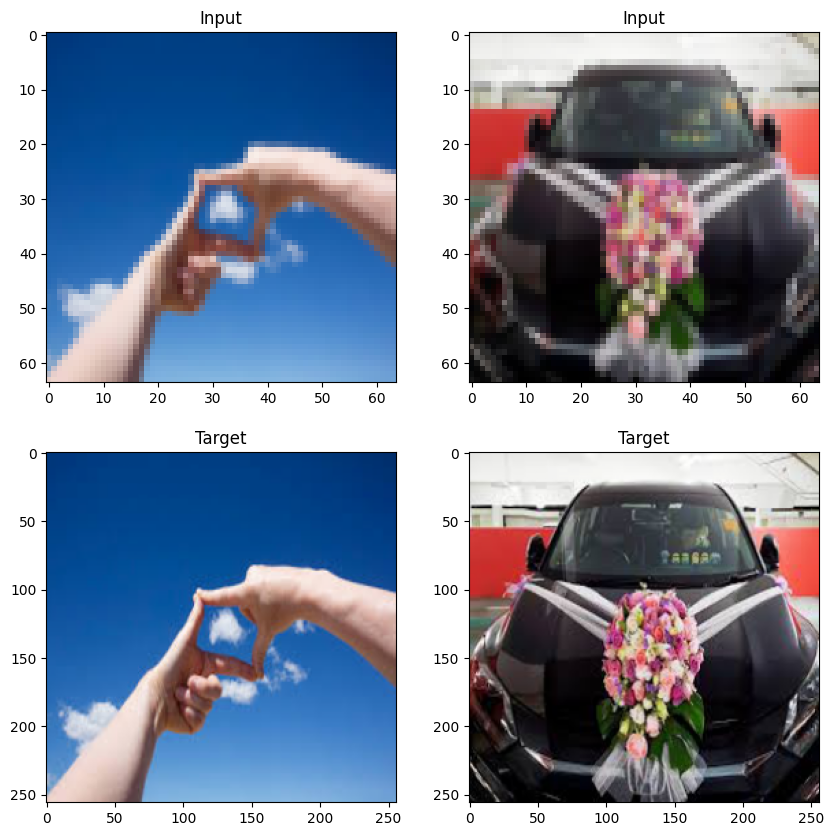

In [9]:
in_batch, tar_batch = next(iter(train_loader))
in_batch = (in_batch + 1) / 2
tar_batch = (tar_batch + 1) / 2

plt.figure(figsize=(10, 10))

ax = plt.subplot(2, 2, 1)
plt.imshow(np.squeeze(in_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 3)
plt.imshow(np.squeeze(tar_batch[0].numpy().transpose((1, 2, 0))))
plt.title("Target")

ax = plt.subplot(2, 2, 2)
plt.imshow(np.squeeze(in_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Input")
ax = plt.subplot(2, 2, 4)
plt.imshow(np.squeeze(tar_batch[1].numpy().transpose((1, 2, 0))))
plt.title("Target")

## Prepare function for Train

In [10]:
def generate_images(model, inputs, labels):
    """Visualizes input, ground truth labels, and model predictions."""
    model.eval()
    with torch.no_grad():
        inputs, labels = inputs.to(device), labels.to(device)
        predictions = model(inputs) # Get predictions from the model

    inputs, labels, predictions = inputs.cpu().numpy(), labels.cpu().numpy(), predictions.cpu().numpy()

    # Prepare the last sample for visualization
    plt.figure(figsize=(15, 20))
    display_list = [
        inputs[-1].transpose((1, 2, 0)), # Input image
        labels[-1].transpose((1, 2, 0)), # Ground truth label
        predictions[-1].transpose((1, 2, 0)) # Model prediction
    ]
    title = ["Input", "Real", "Predicted"]

    # Plot the images with titles
    for i in range(3):
        plt.subplot(1, 3, i+1)
        plt.title(title[i])
        plt.imshow((display_list[i] +1) / 2) # Scale back from [-1, 1] to [0, 1]
        plt.axis("off")
    plt.show()

In [11]:
def train_epoch(model, optimizer, criterion, train_loader, device, epoch=0, log_interval=50):
    total_psnr, total_count = 0, 0
    losses = []
    start_time = time.time()

    model.train()
    for idx, (inputs, labels) in enumerate(train_loader):
        inputs, labels = inputs.to(device), labels.to(device)

        # Reset gradients
        optimizer.zero_grad()

        # Forward pass
        predictions = model(inputs)

        # Compute loss
        loss = criterion(predictions, labels)
        losses.append(loss.item())

        # Backward and optimization
        loss.backward()
        optimizer.step()

        # Compute PSNR for evaluation
        total_psnr += peak_signal_noise_ratio(predictions, labels)
        total_count += 1

        # Logging progress
        if idx % log_interval == 0 and idx > 0:
            elapsed = time.time() - start_time
            print(
                "| Epoch {:3d} | Batch {:5d}/{:5d} | Average PSNR: {:8.3f}".format(
                    epoch, idx, len(train_loader), total_psnr / total_count
                )
            )
            total_psnr, total_count = 0, 0
            start_time = time.time()

    epoch_psnr = total_psnr / total_count # Average PSNR for the epoch
    epoch_loss = sum(losses) / len(losses) # Average loss for the epoch
    return epoch_psnr, epoch_loss


def evaluate_epoch(model, criterion, val_loader, device):
    total_psnr, total_count = 0, 0
    losses = []

    model.eval()
    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(val_loader):
            inputs, labels = inputs.to(device), labels.to(device)

            predictions = model(inputs) # Forward pass
            loss = criterion(predictions, labels) # Compute loss
            losses.append(loss.item())

            total_psnr += peak_signal_noise_ratio(predictions, labels) # Update PSNR
            total_count += 1

    epoch_psnr = total_psnr / total_count # Average PSNR
    epoch_loss = sum(losses) / len(losses) # Average loss
    return epoch_psnr, epoch_loss

In [12]:
def train(model, model_name, save_model, optimizer, criterion, train_loader, val_loader, num_epochs, device):
    train_psnrs, train_losses = [], []
    eval_psnrs, eval_losses = [], []
    best_psnr_eval = -1000
    times = []

    for epoch in range(1, num_epochs + 1):
        epoch_start_time = time.time()

        # Train phase
        train_psnr, train_loss = train_epoch(model, optimizer, criterion, train_loader, device, epoch)
        train_psnrs.append(train_psnr.cpu())
        train_losses.append(train_loss)

        # Evaluation
        eval_psnr, eval_loss = evaluate_epoch(model, criterion, val_loader, device)
        eval_psnrs.append(eval_psnr.cpu())
        eval_losses.append(eval_loss)

        # Save best model
        if best_psnr_eval < eval_psnr:
            torch.save(model.state_dict(), save_model + f"/{model_name}.pt")
            inputs_t, targets_t = next(iter(val_loader))
            generate_images(model, inputs_t, targets_t)
            best_psnr_eval = eval_psnr
        times.append(time.time() - epoch_start_time)

        # Logging progress
        print("=" * 100)
        print(
            "| End of epoch {:3d} | Time: {:5.2f}s | Train psnr {:8.3f} | Train loss {:8.3f} | Val psnr {:8.3f} | Val loss {:8.3f}".format(
                epoch, time.time() - epoch_start_time, train_psnr, train_loss, eval_psnr, eval_loss
            )
        )
        print("=" * 100)

    # Load best model
    model.load_state_dict(torch.load(save_model + f"/{model_name}.pt"))

    return model, train_psnrs, train_losses, eval_psnrs, eval_losses, times

In [13]:
def plot_result(num_epochs, train_psnrs, eval_psnrs, train_losses, eval_losses):
    """Plots the PSNR and loss trends for training and evaluation."""
    epochs = list(range(num_epochs))
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    # Plot PSNR
    axs[0].plot(epochs, train_psnrs, label="Training")
    axs[0].plot(epochs, eval_psnrs, label="Evaluation")
    axs[0].set_xlabel("Epochs")
    axs[0].set_ylabel("PSNR")

    # Plot Loss
    axs[1].plot(epochs, train_losses, label="Training")
    axs[1].plot(epochs, eval_losses, label="Evaluation")
    axs[1].set_xlabel("Epochs")
    axs[1].set_ylabel("Loss")

    plt.legend()

In [14]:
def predict_and_display(model, test_loader, device):
    """Predicts and displays the model's results for test data"""
    model.eval()
    with torch.no_grad():
        for idx, (inputs, labels) in enumerate(test_loader):
            if idx >= 10: # Limit to 10 batches
                break
            inputs, labels = inputs.to(device), labels.to(device)
            predictions = model(inputs) # Get predictions from the model
            generate_images(model, inputs, labels) # Visualize results
            plt.show()

## Unet for image super resolution task

### Unet with skip connection

In [15]:
class FirstFeature(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FirstFeature, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0, bias=False),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class Encoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.MaxPool2d(2),
            ConvBlock(in_channels, out_channels)
        )

    def forward(self, x):
        x = self.encoder(x)
        return x


class Decoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(Decoder, self).__init__()
        self.conv = nn.Sequential(
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(),
        )
        self.conv_block = ConvBlock(in_channels, out_channels)

    def forward(self, x, skip):
        x = self.conv(x)
        x = torch.concat([x, skip], dim=1)
        x = self.conv_block(x)
        return x


class FinalOutput(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FinalOutput, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        return self.conv(x)


class SR_Unet(nn.Module):
    def __init__(self, n_channels=3, n_classes=3):
        super(SR_Unet, self).__init__()

        self.n_channels = n_channels
        self.n_classes = n_classes
        self.resize_fnc = transforms.Resize((LOW_IMG_HEIGHT*4, LOW_IMG_HEIGHT*4), antialias=True)

        self.in_conv1 = FirstFeature(n_channels, 64)
        self.in_conv2 = ConvBlock(64, 64)

        self.enc_1 = Encoder(64, 128)
        self.enc_2 = Encoder(128, 256)
        self.enc_3 = Encoder(256, 512)
        self.enc_4 = Encoder(512, 1024)

        self.dec_1 = Decoder(1024, 512)
        self.dec_2 = Decoder(512, 256)
        self.dec_3 = Decoder(256, 128)
        self.dec_4 = Decoder(128, 64)

        self.out_conv = FinalOutput(64, n_classes)


    def forward(self, x):
        x = self.resize_fnc(x)

        x = self.in_conv1(x)
        x1 = self.in_conv2(x)

        x2 = self.enc_1(x1)
        x3 = self.enc_2(x2)
        x4 = self.enc_3(x3)
        x5 = self.enc_4(x4)

        x = self.dec_1(x5, x4)
        x = self.dec_2(x, x3)
        x = self.dec_3(x, x2)
        x = self.dec_4(x, x1)

        x = self.out_conv(x)
        return x

In [19]:
sr_unet_model = SR_Unet().to(device)
img = torch.ones(2, 3, 256, 256).to(device)
sr_unet_model(img).shape

torch.Size([2, 3, 256, 256])

### Training

In [20]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

SR_unet_model = SR_Unet().to(device)
criterion = nn.L1Loss()
optimizer = optim.Adam(SR_unet_model.parameters(), lr=1e-4, betas=[0.5, 0.999])

save_model = "./UNET"
os.makedirs(save_model, exist_ok=True)

EPOCHS = 100

| Epoch   1 | Batch    50/   86 | Average PSNR:   19.119


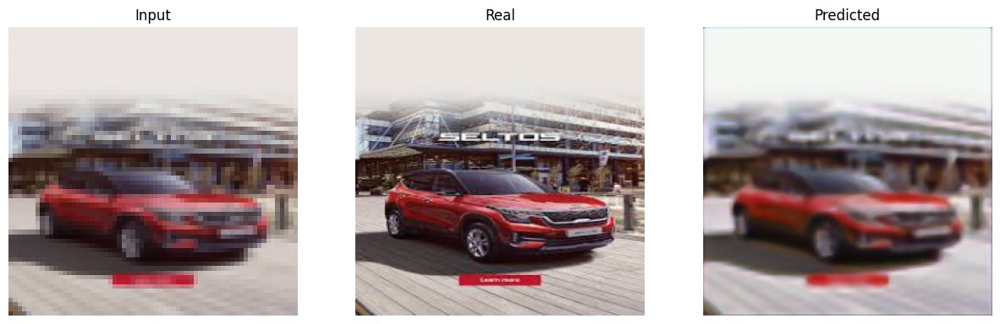

| End of epoch   1 | Time: 53.16s | Train psnr   20.942 | Train loss    0.157 | Val psnr   22.586 | Val loss    0.100
| Epoch   2 | Batch    50/   86 | Average PSNR:   21.570


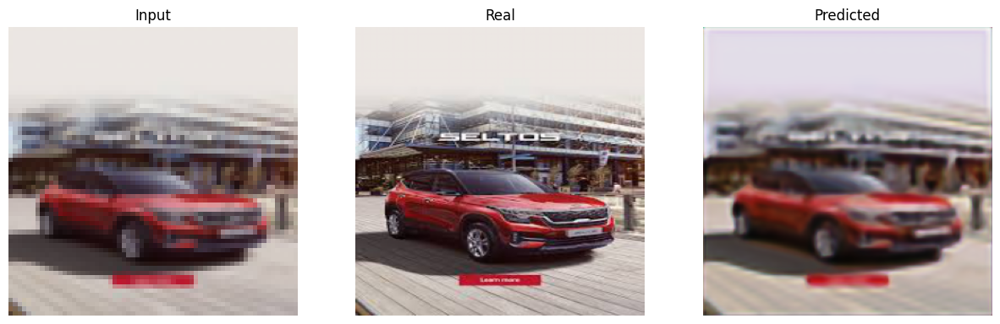

| End of epoch   2 | Time: 51.56s | Train psnr   22.191 | Train loss    0.116 | Val psnr   23.099 | Val loss    0.090
| Epoch   3 | Batch    50/   86 | Average PSNR:   22.441


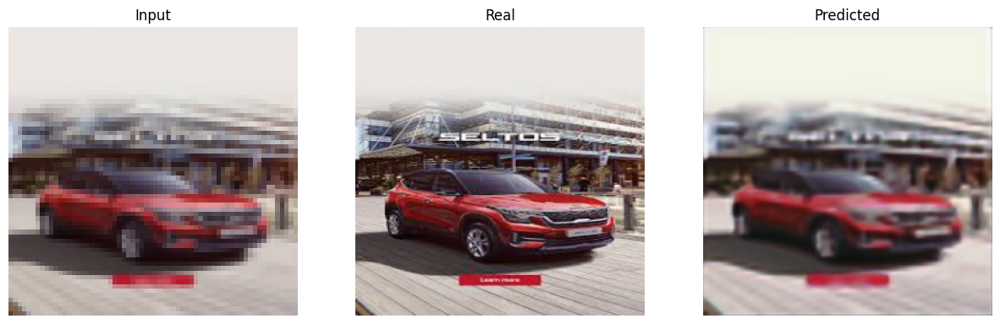

| End of epoch   3 | Time: 52.36s | Train psnr   22.186 | Train loss    0.109 | Val psnr   23.196 | Val loss    0.093
| Epoch   4 | Batch    50/   86 | Average PSNR:   22.785


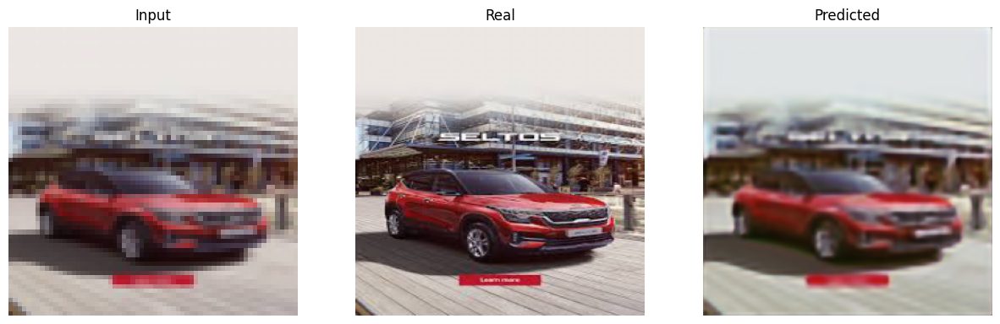

| End of epoch   4 | Time: 51.94s | Train psnr   23.115 | Train loss    0.100 | Val psnr   23.891 | Val loss    0.084
| Epoch   5 | Batch    50/   86 | Average PSNR:   23.114


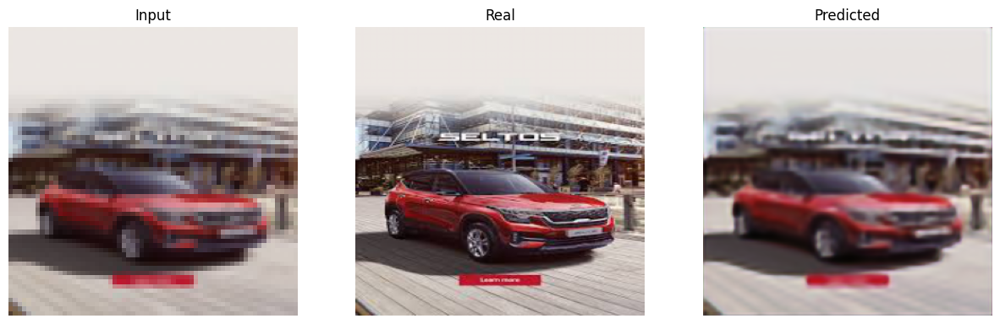

| End of epoch   5 | Time: 52.01s | Train psnr   23.011 | Train loss    0.098 | Val psnr   24.206 | Val loss    0.077
| Epoch   6 | Batch    50/   86 | Average PSNR:   23.408
| End of epoch   6 | Time: 51.23s | Train psnr   23.222 | Train loss    0.094 | Val psnr   23.398 | Val loss    0.086
| Epoch   7 | Batch    50/   86 | Average PSNR:   23.664
| End of epoch   7 | Time: 51.18s | Train psnr   23.541 | Train loss    0.090 | Val psnr   23.752 | Val loss    0.085
| Epoch   8 | Batch    50/   86 | Average PSNR:   23.855
| End of epoch   8 | Time: 51.18s | Train psnr   23.569 | Train loss    0.088 | Val psnr   23.809 | Val loss    0.084
| Epoch   9 | Batch    50/   86 | Average PSNR:   23.720


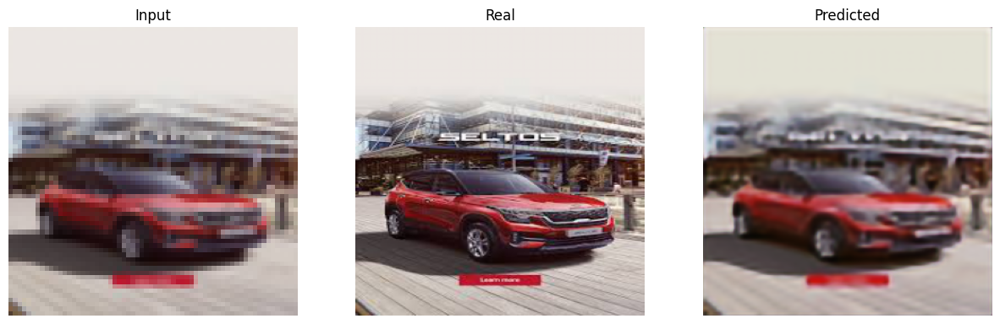

| End of epoch   9 | Time: 51.97s | Train psnr   23.970 | Train loss    0.087 | Val psnr   24.330 | Val loss    0.078
| Epoch  10 | Batch    50/   86 | Average PSNR:   23.984
| End of epoch  10 | Time: 51.21s | Train psnr   23.721 | Train loss    0.086 | Val psnr   23.488 | Val loss    0.082
| Epoch  11 | Batch    50/   86 | Average PSNR:   23.993
| End of epoch  11 | Time: 51.03s | Train psnr   23.920 | Train loss    0.085 | Val psnr   24.324 | Val loss    0.080
| Epoch  12 | Batch    50/   86 | Average PSNR:   23.993
| End of epoch  12 | Time: 51.04s | Train psnr   24.109 | Train loss    0.084 | Val psnr   23.932 | Val loss    0.085
| Epoch  13 | Batch    50/   86 | Average PSNR:   23.857


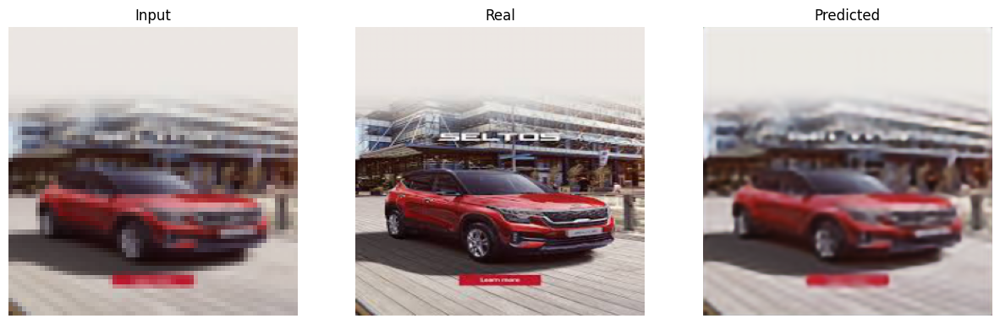

| End of epoch  13 | Time: 52.16s | Train psnr   24.186 | Train loss    0.085 | Val psnr   24.616 | Val loss    0.074
| Epoch  14 | Batch    50/   86 | Average PSNR:   24.313


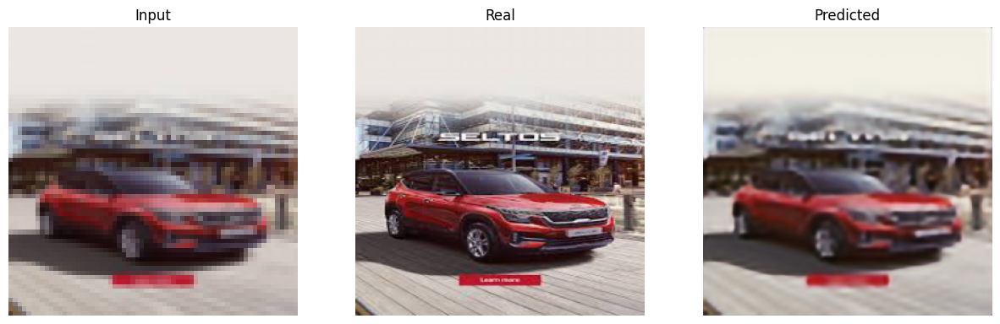

| End of epoch  14 | Time: 51.93s | Train psnr   23.962 | Train loss    0.082 | Val psnr   24.745 | Val loss    0.071
| Epoch  15 | Batch    50/   86 | Average PSNR:   24.045
| End of epoch  15 | Time: 51.30s | Train psnr   24.167 | Train loss    0.084 | Val psnr   24.697 | Val loss    0.072
| Epoch  16 | Batch    50/   86 | Average PSNR:   24.165


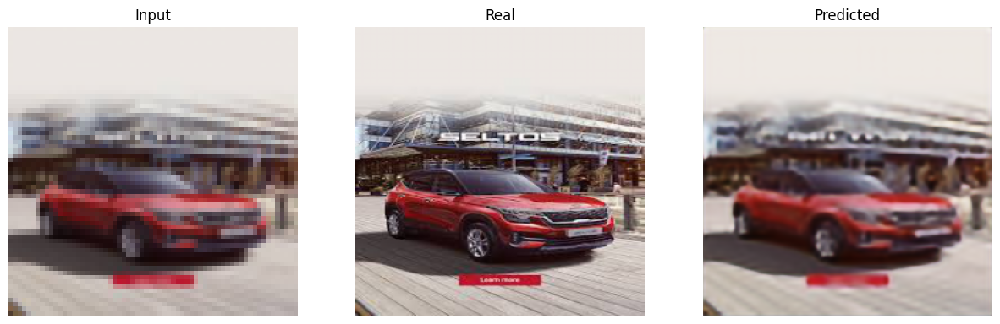

| End of epoch  16 | Time: 52.29s | Train psnr   24.245 | Train loss    0.082 | Val psnr   24.869 | Val loss    0.070
| Epoch  17 | Batch    50/   86 | Average PSNR:   24.374
| End of epoch  17 | Time: 51.53s | Train psnr   24.028 | Train loss    0.082 | Val psnr   24.755 | Val loss    0.074
| Epoch  18 | Batch    50/   86 | Average PSNR:   24.509
| End of epoch  18 | Time: 51.22s | Train psnr   24.218 | Train loss    0.079 | Val psnr   24.706 | Val loss    0.073
| Epoch  19 | Batch    50/   86 | Average PSNR:   24.439
| End of epoch  19 | Time: 51.21s | Train psnr   24.021 | Train loss    0.081 | Val psnr   24.208 | Val loss    0.078
| Epoch  20 | Batch    50/   86 | Average PSNR:   24.242


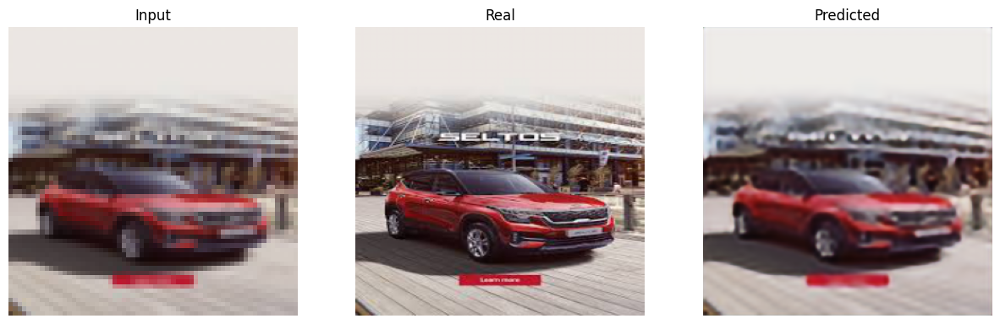

| End of epoch  20 | Time: 52.17s | Train psnr   24.326 | Train loss    0.081 | Val psnr   24.965 | Val loss    0.069
| Epoch  21 | Batch    50/   86 | Average PSNR:   24.476
| End of epoch  21 | Time: 51.48s | Train psnr   24.255 | Train loss    0.079 | Val psnr   24.772 | Val loss    0.073
| Epoch  22 | Batch    50/   86 | Average PSNR:   24.406
| End of epoch  22 | Time: 51.30s | Train psnr   24.554 | Train loss    0.078 | Val psnr   23.599 | Val loss    0.078
| Epoch  23 | Batch    50/   86 | Average PSNR:   24.397
| End of epoch  23 | Time: 51.13s | Train psnr   23.258 | Train loss    0.084 | Val psnr   24.071 | Val loss    0.085
| Epoch  24 | Batch    50/   86 | Average PSNR:   24.157
| End of epoch  24 | Time: 51.25s | Train psnr   24.264 | Train loss    0.082 | Val psnr   24.811 | Val loss    0.072
| Epoch  25 | Batch    50/   86 | Average PSNR:   24.158
| End of epoch  25 | Time: 51.04s | Train psnr   24.668 | Train loss    0.079 | Val psnr   24.918 | Val loss    0.070
| Epoch

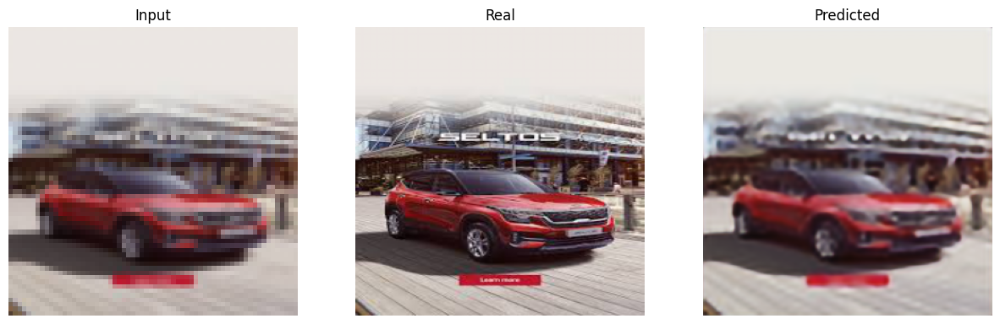

| End of epoch  27 | Time: 51.97s | Train psnr   24.393 | Train loss    0.077 | Val psnr   25.051 | Val loss    0.069
| Epoch  28 | Batch    50/   86 | Average PSNR:   24.961
| End of epoch  28 | Time: 51.20s | Train psnr   24.356 | Train loss    0.074 | Val psnr   25.041 | Val loss    0.068
| Epoch  29 | Batch    50/   86 | Average PSNR:   24.674
| End of epoch  29 | Time: 51.14s | Train psnr   24.399 | Train loss    0.077 | Val psnr   23.194 | Val loss    0.097
| Epoch  30 | Batch    50/   86 | Average PSNR:   24.335
| End of epoch  30 | Time: 51.24s | Train psnr   24.893 | Train loss    0.077 | Val psnr   24.911 | Val loss    0.072
| Epoch  31 | Batch    50/   86 | Average PSNR:   24.838


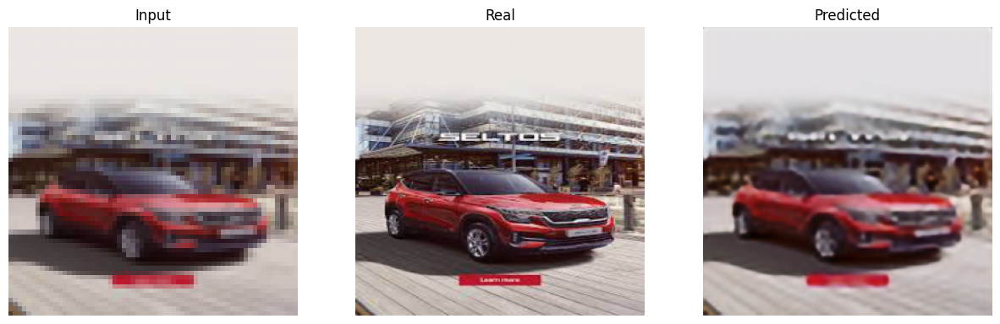

| End of epoch  31 | Time: 51.81s | Train psnr   24.343 | Train loss    0.076 | Val psnr   25.157 | Val loss    0.067
| Epoch  32 | Batch    50/   86 | Average PSNR:   24.725


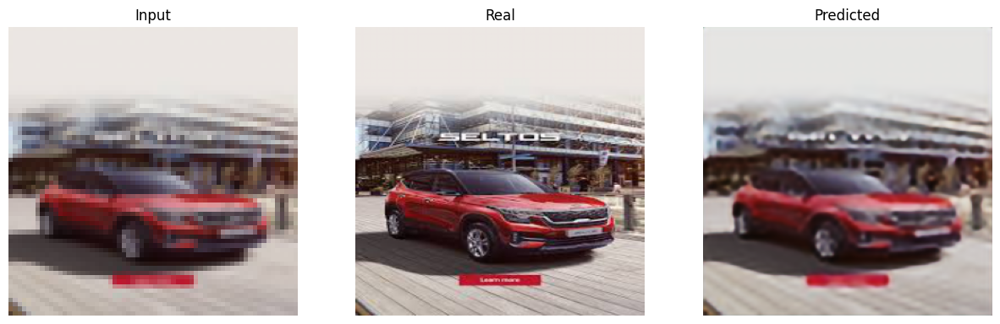

| End of epoch  32 | Time: 52.09s | Train psnr   24.755 | Train loss    0.075 | Val psnr   25.180 | Val loss    0.067
| Epoch  33 | Batch    50/   86 | Average PSNR:   24.626
| End of epoch  33 | Time: 51.32s | Train psnr   25.059 | Train loss    0.073 | Val psnr   25.133 | Val loss    0.067
| Epoch  34 | Batch    50/   86 | Average PSNR:   24.784
| End of epoch  34 | Time: 51.26s | Train psnr   24.884 | Train loss    0.073 | Val psnr   25.093 | Val loss    0.070
| Epoch  35 | Batch    50/   86 | Average PSNR:   24.773
| End of epoch  35 | Time: 51.25s | Train psnr   24.850 | Train loss    0.073 | Val psnr   25.059 | Val loss    0.069
| Epoch  36 | Batch    50/   86 | Average PSNR:   24.954


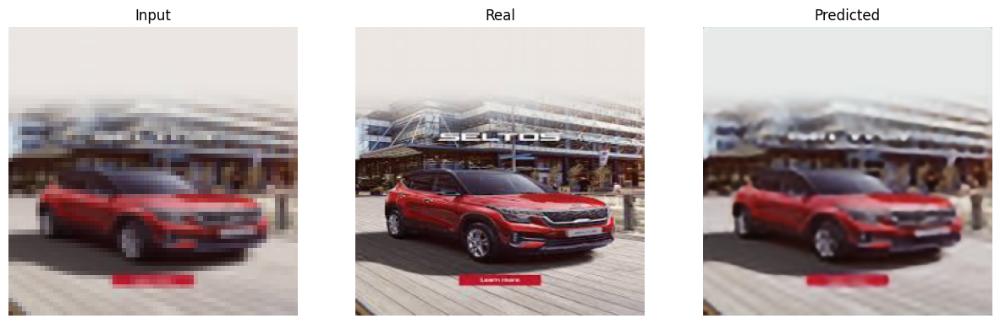

| End of epoch  36 | Time: 51.87s | Train psnr   24.597 | Train loss    0.074 | Val psnr   25.223 | Val loss    0.066
| Epoch  37 | Batch    50/   86 | Average PSNR:   24.749
| End of epoch  37 | Time: 51.24s | Train psnr   24.941 | Train loss    0.073 | Val psnr   25.215 | Val loss    0.067
| Epoch  38 | Batch    50/   86 | Average PSNR:   24.830
| End of epoch  38 | Time: 51.06s | Train psnr   24.917 | Train loss    0.073 | Val psnr   25.022 | Val loss    0.071
| Epoch  39 | Batch    50/   86 | Average PSNR:   24.875


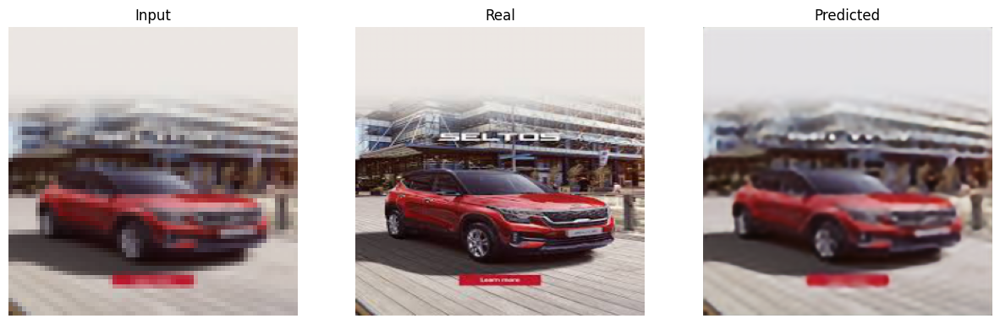

| End of epoch  39 | Time: 52.05s | Train psnr   24.765 | Train loss    0.073 | Val psnr   25.250 | Val loss    0.067
| Epoch  40 | Batch    50/   86 | Average PSNR:   25.032


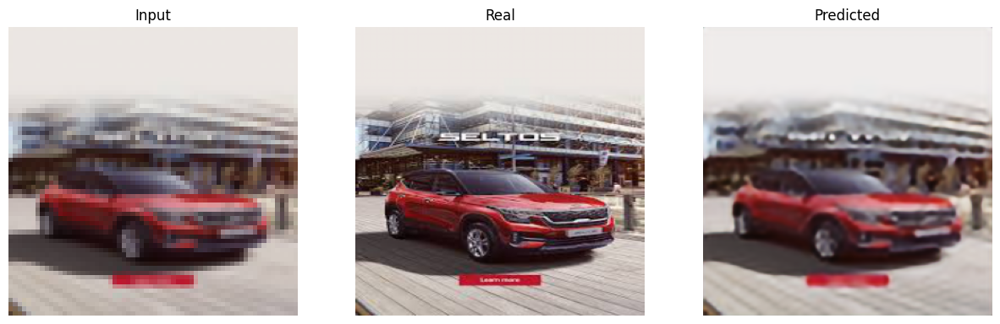

| End of epoch  40 | Time: 51.81s | Train psnr   24.801 | Train loss    0.072 | Val psnr   25.271 | Val loss    0.066
| Epoch  41 | Batch    50/   86 | Average PSNR:   25.012


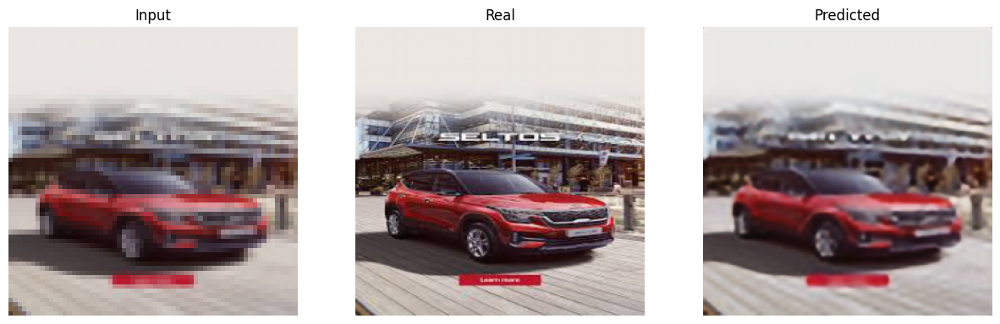

| End of epoch  41 | Time: 52.04s | Train psnr   24.892 | Train loss    0.071 | Val psnr   25.290 | Val loss    0.066
| Epoch  42 | Batch    50/   86 | Average PSNR:   24.994
| End of epoch  42 | Time: 51.13s | Train psnr   24.885 | Train loss    0.072 | Val psnr   25.113 | Val loss    0.071
| Epoch  43 | Batch    50/   86 | Average PSNR:   24.928
| End of epoch  43 | Time: 51.20s | Train psnr   24.741 | Train loss    0.074 | Val psnr   25.228 | Val loss    0.066
| Epoch  44 | Batch    50/   86 | Average PSNR:   24.982
| End of epoch  44 | Time: 51.24s | Train psnr   24.755 | Train loss    0.073 | Val psnr   14.761 | Val loss    0.167
| Epoch  45 | Batch    50/   86 | Average PSNR:   24.718
| End of epoch  45 | Time: 51.24s | Train psnr   24.957 | Train loss    0.072 | Val psnr   25.267 | Val loss    0.067
| Epoch  46 | Batch    50/   86 | Average PSNR:   24.921


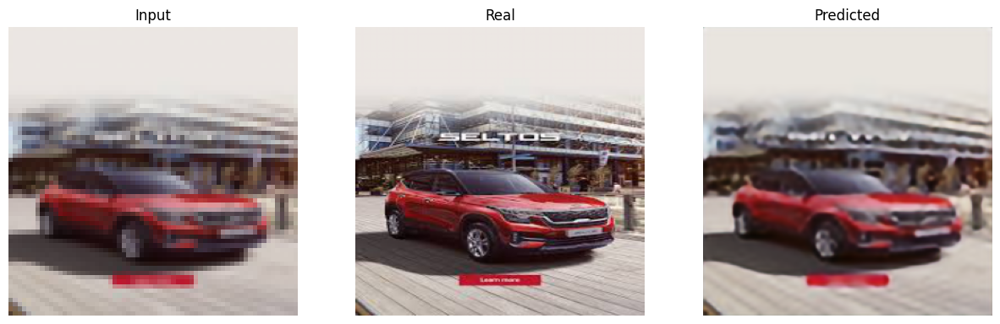

| End of epoch  46 | Time: 52.08s | Train psnr   25.057 | Train loss    0.072 | Val psnr   25.395 | Val loss    0.064
| Epoch  47 | Batch    50/   86 | Average PSNR:   24.783
| End of epoch  47 | Time: 51.18s | Train psnr   24.948 | Train loss    0.073 | Val psnr   25.247 | Val loss    0.066
| Epoch  48 | Batch    50/   86 | Average PSNR:   25.085
| End of epoch  48 | Time: 51.08s | Train psnr   25.006 | Train loss    0.071 | Val psnr   25.182 | Val loss    0.068
| Epoch  49 | Batch    50/   86 | Average PSNR:   25.023
| End of epoch  49 | Time: 51.02s | Train psnr   25.072 | Train loss    0.071 | Val psnr   25.205 | Val loss    0.066
| Epoch  50 | Batch    50/   86 | Average PSNR:   24.966
| End of epoch  50 | Time: 51.04s | Train psnr   25.129 | Train loss    0.070 | Val psnr   25.225 | Val loss    0.069
| Epoch  51 | Batch    50/   86 | Average PSNR:   25.245
| End of epoch  51 | Time: 51.16s | Train psnr   25.055 | Train loss    0.069 | Val psnr   25.313 | Val loss    0.065
| Epoch

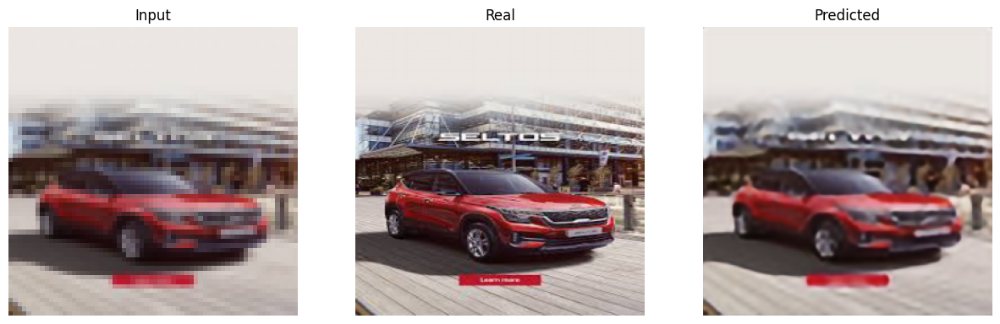

| End of epoch  52 | Time: 51.96s | Train psnr   25.046 | Train loss    0.070 | Val psnr   25.479 | Val loss    0.063
| Epoch  53 | Batch    50/   86 | Average PSNR:   25.212
| End of epoch  53 | Time: 51.18s | Train psnr   25.172 | Train loss    0.069 | Val psnr   25.314 | Val loss    0.066
| Epoch  54 | Batch    50/   86 | Average PSNR:   25.147
| End of epoch  54 | Time: 51.12s | Train psnr   25.100 | Train loss    0.070 | Val psnr   25.279 | Val loss    0.066
| Epoch  55 | Batch    50/   86 | Average PSNR:   25.211
| End of epoch  55 | Time: 51.27s | Train psnr   25.003 | Train loss    0.070 | Val psnr   24.780 | Val loss    0.078
| Epoch  56 | Batch    50/   86 | Average PSNR:   25.025
| End of epoch  56 | Time: 51.21s | Train psnr   25.254 | Train loss    0.070 | Val psnr   25.136 | Val loss    0.072
| Epoch  57 | Batch    50/   86 | Average PSNR:   25.136
| End of epoch  57 | Time: 51.15s | Train psnr   25.129 | Train loss    0.070 | Val psnr   25.456 | Val loss    0.064
| Epoch

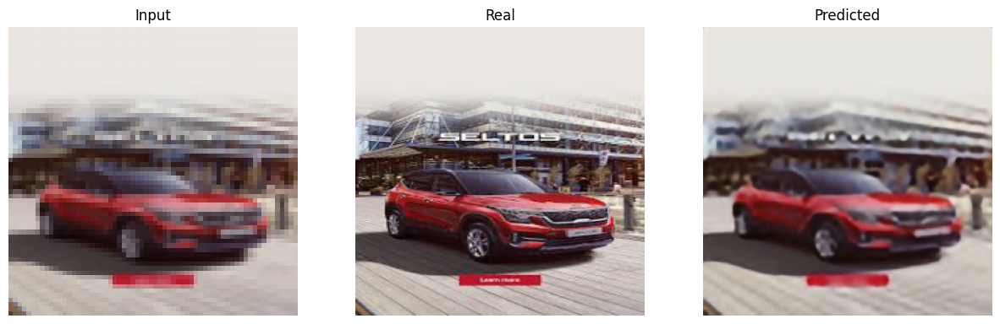

| End of epoch  60 | Time: 52.04s | Train psnr   25.031 | Train loss    0.069 | Val psnr   25.490 | Val loss    0.063
| Epoch  61 | Batch    50/   86 | Average PSNR:   25.178
| End of epoch  61 | Time: 51.19s | Train psnr   25.431 | Train loss    0.068 | Val psnr   25.488 | Val loss    0.064
| Epoch  62 | Batch    50/   86 | Average PSNR:   25.124
| End of epoch  62 | Time: 51.22s | Train psnr   25.219 | Train loss    0.069 | Val psnr   25.458 | Val loss    0.063
| Epoch  63 | Batch    50/   86 | Average PSNR:   25.334
| End of epoch  63 | Time: 51.14s | Train psnr   25.018 | Train loss    0.069 | Val psnr   25.457 | Val loss    0.064
| Epoch  64 | Batch    50/   86 | Average PSNR:   25.103
| End of epoch  64 | Time: 51.10s | Train psnr   25.507 | Train loss    0.068 | Val psnr   25.440 | Val loss    0.064
| Epoch  65 | Batch    50/   86 | Average PSNR:   25.186


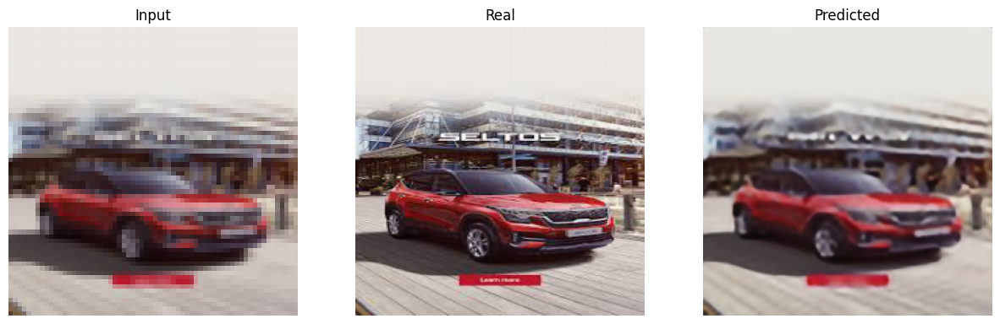

| End of epoch  65 | Time: 51.89s | Train psnr   25.355 | Train loss    0.069 | Val psnr   25.535 | Val loss    0.063
| Epoch  66 | Batch    50/   86 | Average PSNR:   25.287
| End of epoch  66 | Time: 51.05s | Train psnr   25.340 | Train loss    0.067 | Val psnr   25.438 | Val loss    0.066
| Epoch  67 | Batch    50/   86 | Average PSNR:   25.272
| End of epoch  67 | Time: 51.06s | Train psnr   25.367 | Train loss    0.067 | Val psnr   25.309 | Val loss    0.068
| Epoch  68 | Batch    50/   86 | Average PSNR:   25.318
| End of epoch  68 | Time: 51.08s | Train psnr   25.255 | Train loss    0.068 | Val psnr   25.482 | Val loss    0.063
| Epoch  69 | Batch    50/   86 | Average PSNR:   25.249
| End of epoch  69 | Time: 51.11s | Train psnr   25.388 | Train loss    0.068 | Val psnr   25.148 | Val loss    0.071
| Epoch  70 | Batch    50/   86 | Average PSNR:   25.227
| End of epoch  70 | Time: 51.01s | Train psnr   25.165 | Train loss    0.068 | Val psnr   25.352 | Val loss    0.065
| Epoch

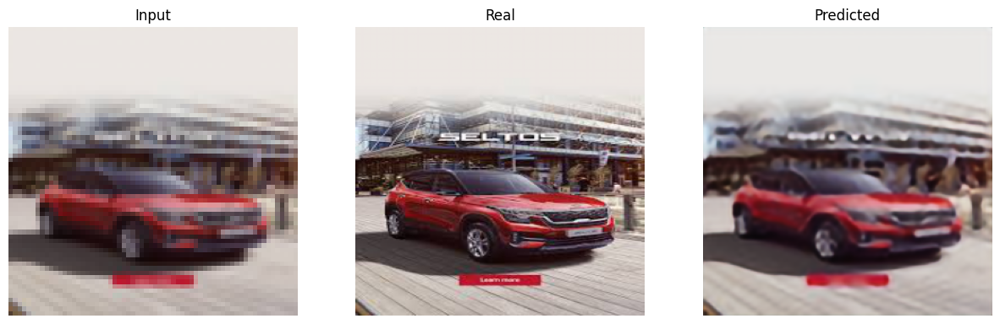

| End of epoch  72 | Time: 52.08s | Train psnr   25.239 | Train loss    0.067 | Val psnr   25.559 | Val loss    0.062
| Epoch  73 | Batch    50/   86 | Average PSNR:   25.198
| End of epoch  73 | Time: 51.28s | Train psnr   25.655 | Train loss    0.067 | Val psnr   25.515 | Val loss    0.064
| Epoch  74 | Batch    50/   86 | Average PSNR:   25.312
| End of epoch  74 | Time: 51.23s | Train psnr   25.239 | Train loss    0.068 | Val psnr   25.412 | Val loss    0.066
| Epoch  75 | Batch    50/   86 | Average PSNR:   25.405


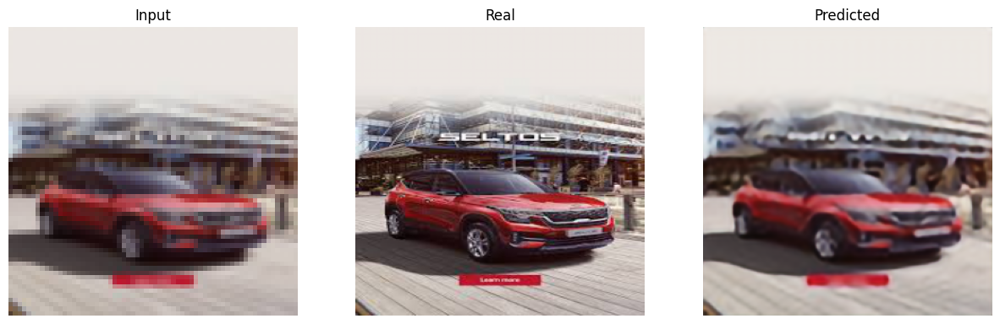

| End of epoch  75 | Time: 51.95s | Train psnr   25.273 | Train loss    0.067 | Val psnr   25.585 | Val loss    0.063
| Epoch  76 | Batch    50/   86 | Average PSNR:   25.410
| End of epoch  76 | Time: 51.22s | Train psnr   25.377 | Train loss    0.067 | Val psnr   25.567 | Val loss    0.062
| Epoch  77 | Batch    50/   86 | Average PSNR:   25.355
| End of epoch  77 | Time: 51.23s | Train psnr   25.458 | Train loss    0.066 | Val psnr   25.407 | Val loss    0.067
| Epoch  78 | Batch    50/   86 | Average PSNR:   25.346
| End of epoch  78 | Time: 51.10s | Train psnr   25.409 | Train loss    0.067 | Val psnr   25.304 | Val loss    0.068
| Epoch  79 | Batch    50/   86 | Average PSNR:   25.259
| End of epoch  79 | Time: 51.08s | Train psnr   25.676 | Train loss    0.066 | Val psnr   25.371 | Val loss    0.068
| Epoch  80 | Batch    50/   86 | Average PSNR:   25.492


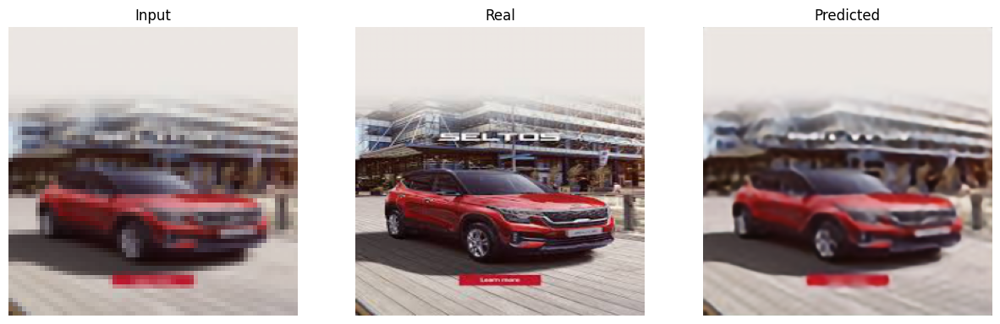

| End of epoch  80 | Time: 51.87s | Train psnr   25.317 | Train loss    0.066 | Val psnr   25.645 | Val loss    0.062
| Epoch  81 | Batch    50/   86 | Average PSNR:   25.263
| End of epoch  81 | Time: 51.16s | Train psnr   25.552 | Train loss    0.067 | Val psnr   25.363 | Val loss    0.069
| Epoch  82 | Batch    50/   86 | Average PSNR:   25.501
| End of epoch  82 | Time: 51.00s | Train psnr   25.335 | Train loss    0.066 | Val psnr   25.411 | Val loss    0.065
| Epoch  83 | Batch    50/   86 | Average PSNR:   25.211
| End of epoch  83 | Time: 50.99s | Train psnr   25.697 | Train loss    0.067 | Val psnr   24.367 | Val loss    0.080
| Epoch  84 | Batch    50/   86 | Average PSNR:   25.468
| End of epoch  84 | Time: 51.13s | Train psnr   25.404 | Train loss    0.066 | Val psnr   25.582 | Val loss    0.063
| Epoch  85 | Batch    50/   86 | Average PSNR:   25.543
| End of epoch  85 | Time: 50.99s | Train psnr   25.311 | Train loss    0.066 | Val psnr   25.486 | Val loss    0.064
| Epoch

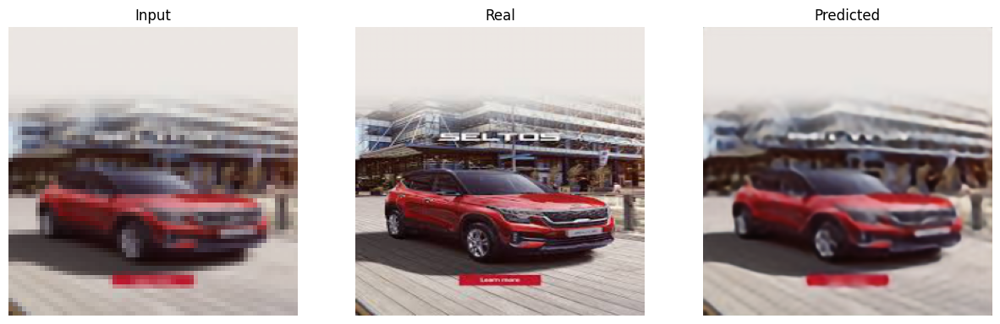

| End of epoch  86 | Time: 51.94s | Train psnr   25.597 | Train loss    0.065 | Val psnr   25.647 | Val loss    0.061
| Epoch  87 | Batch    50/   86 | Average PSNR:   25.483
| End of epoch  87 | Time: 51.07s | Train psnr   25.174 | Train loss    0.068 | Val psnr   25.624 | Val loss    0.063
| Epoch  88 | Batch    50/   86 | Average PSNR:   25.305
| End of epoch  88 | Time: 51.08s | Train psnr   25.647 | Train loss    0.066 | Val psnr   25.328 | Val loss    0.065
| Epoch  89 | Batch    50/   86 | Average PSNR:   25.597
| End of epoch  89 | Time: 51.33s | Train psnr   25.449 | Train loss    0.065 | Val psnr   25.626 | Val loss    0.063
| Epoch  90 | Batch    50/   86 | Average PSNR:   25.496
| End of epoch  90 | Time: 51.29s | Train psnr   25.624 | Train loss    0.065 | Val psnr   25.389 | Val loss    0.067
| Epoch  91 | Batch    50/   86 | Average PSNR:   25.605
| End of epoch  91 | Time: 51.19s | Train psnr   25.322 | Train loss    0.065 | Val psnr   25.598 | Val loss    0.063
| Epoch

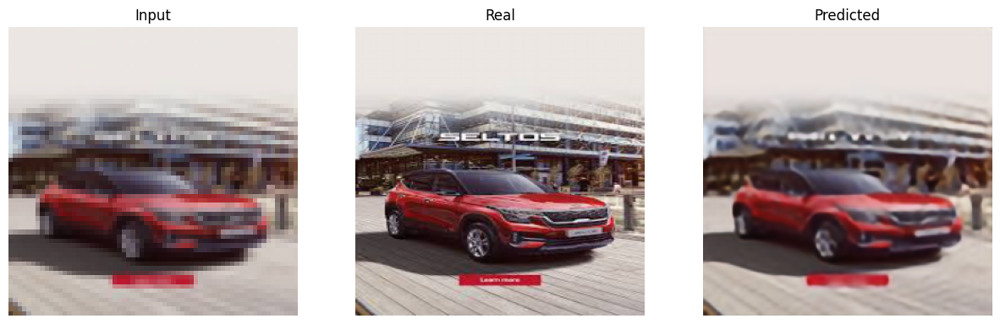

| End of epoch  95 | Time: 51.85s | Train psnr   25.678 | Train loss    0.065 | Val psnr   25.663 | Val loss    0.062
| Epoch  96 | Batch    50/   86 | Average PSNR:   25.478


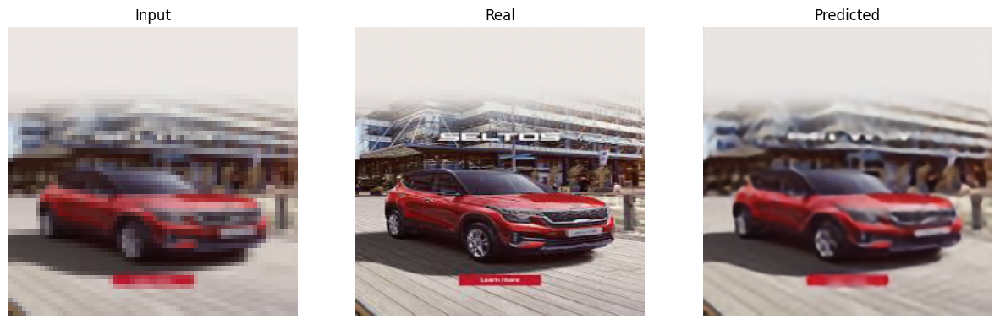

| End of epoch  96 | Time: 51.95s | Train psnr   25.702 | Train loss    0.065 | Val psnr   25.724 | Val loss    0.062
| Epoch  97 | Batch    50/   86 | Average PSNR:   25.562
| End of epoch  97 | Time: 51.12s | Train psnr   25.645 | Train loss    0.064 | Val psnr   25.670 | Val loss    0.062
| Epoch  98 | Batch    50/   86 | Average PSNR:   25.658
| End of epoch  98 | Time: 51.09s | Train psnr   25.312 | Train loss    0.065 | Val psnr   25.484 | Val loss    0.065
| Epoch  99 | Batch    50/   86 | Average PSNR:   25.531
| End of epoch  99 | Time: 51.19s | Train psnr   25.579 | Train loss    0.065 | Val psnr   25.531 | Val loss    0.065
| Epoch 100 | Batch    50/   86 | Average PSNR:   25.674
| End of epoch 100 | Time: 51.14s | Train psnr   25.527 | Train loss    0.064 | Val psnr   25.618 | Val loss    0.063


<ipython-input-12-2844d6e77386>:38: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(save_model + f"/{model_name}.pt"))


In [21]:
SR_unet_model, train_psnrs, train_losses, eval_psnrs, eval_losses, times = train(
    SR_unet_model,
    "SR_unet_model",
    save_model,
    optimizer,
    criterion,
    train_loader,
    test_loader,
    EPOCHS,
    device
)

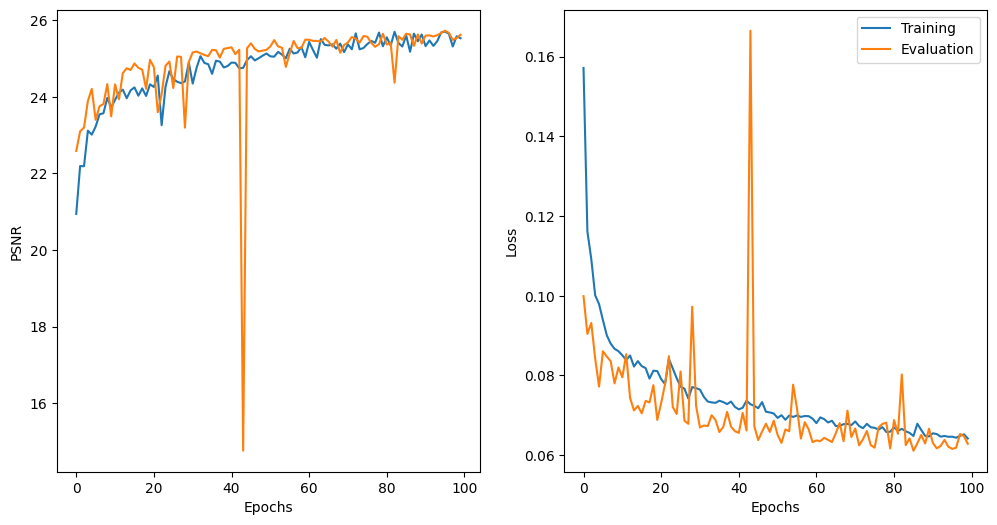

In [22]:
plot_result(EPOCHS, train_psnrs, eval_psnrs, train_losses, eval_losses)

## Evaluation

In [23]:
test_psnr, test_loss = evaluate_epoch(SR_unet_model, criterion, test_loader, device)
test_psnr, test_loss

(tensor(25.7236, device='cuda:0'), 0.06154954755170779)

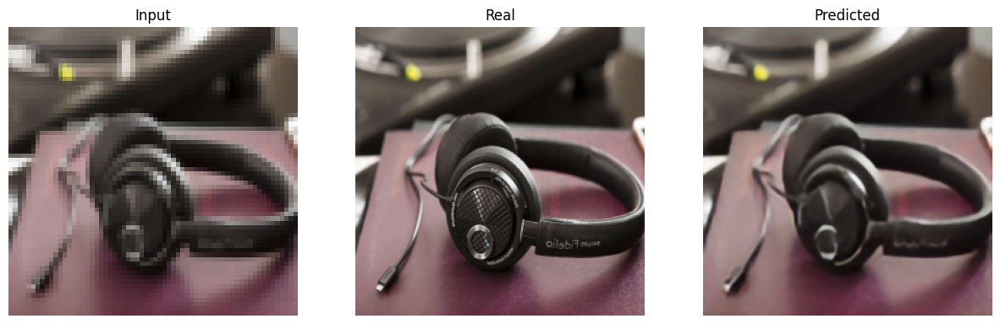

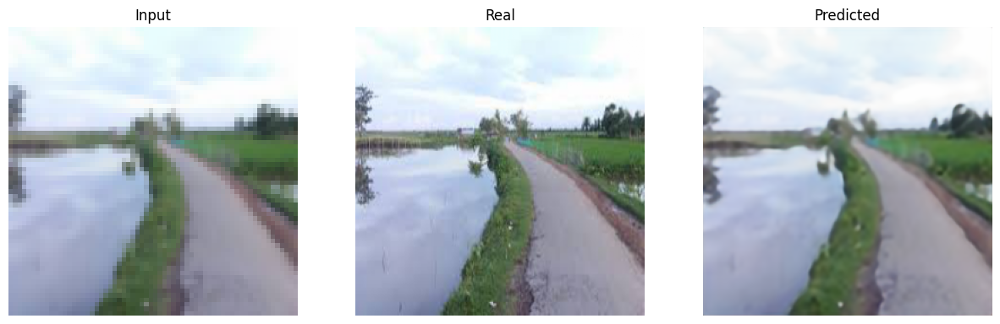

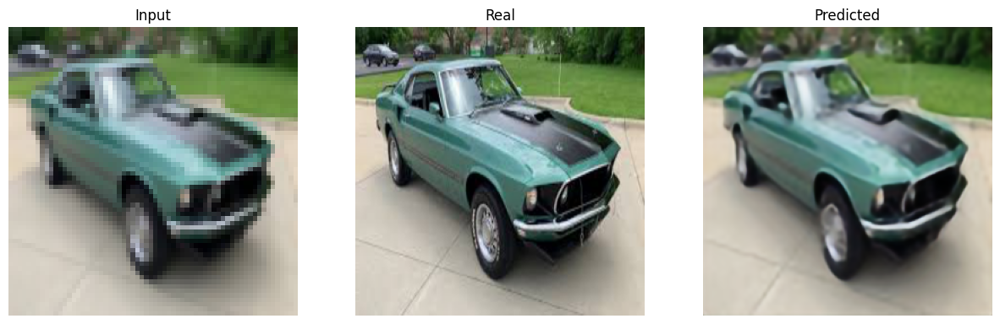

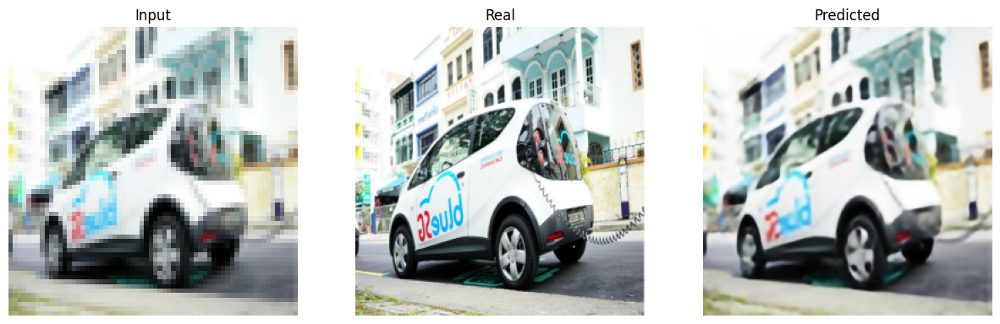

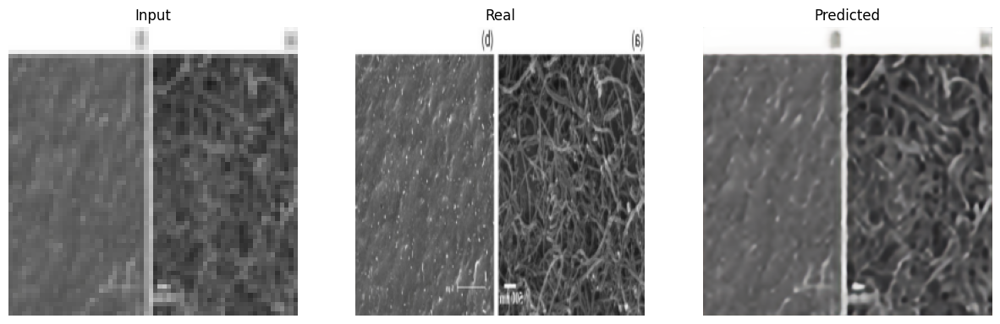

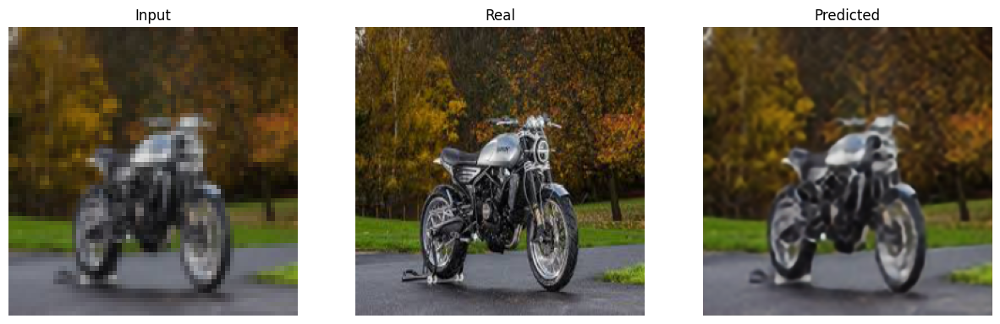

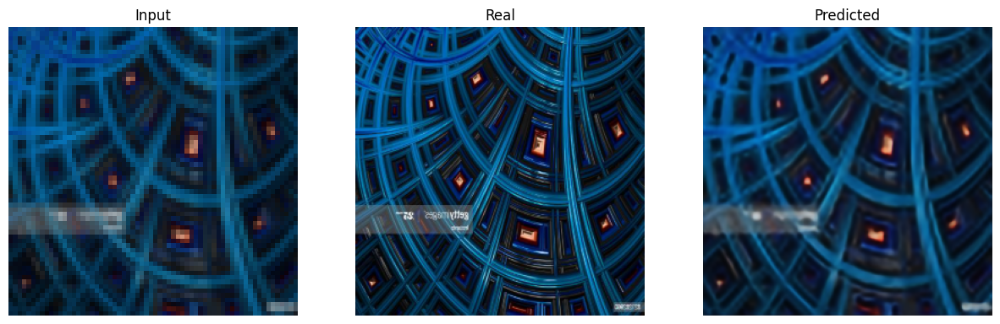

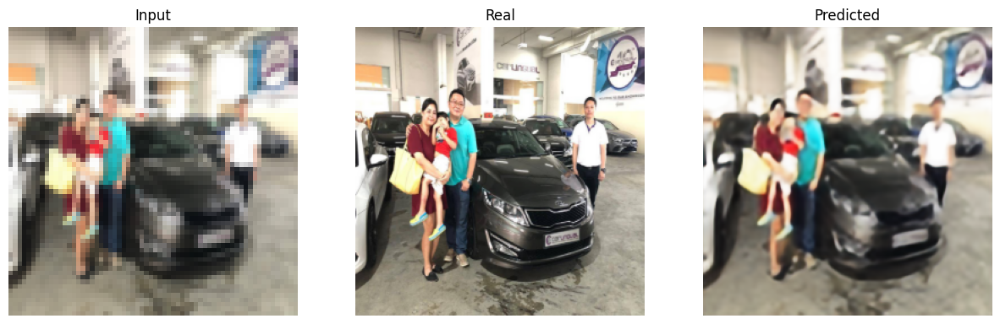

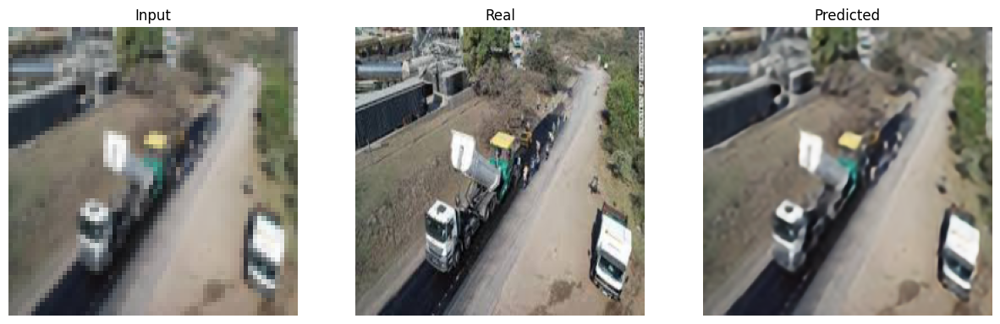

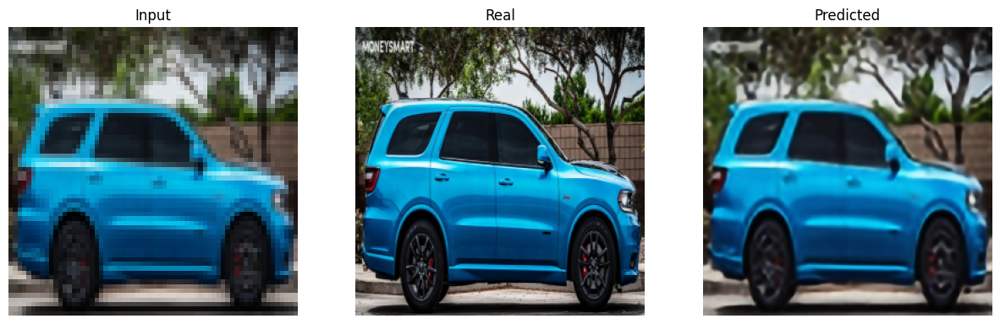

In [24]:
predict_and_display(SR_unet_model, train_loader, device)

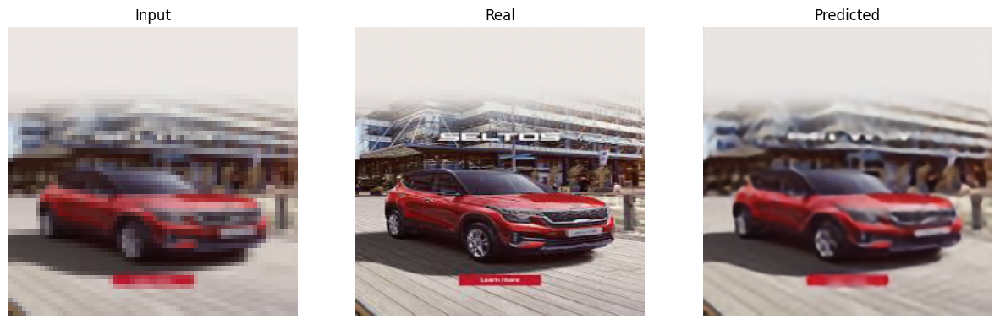

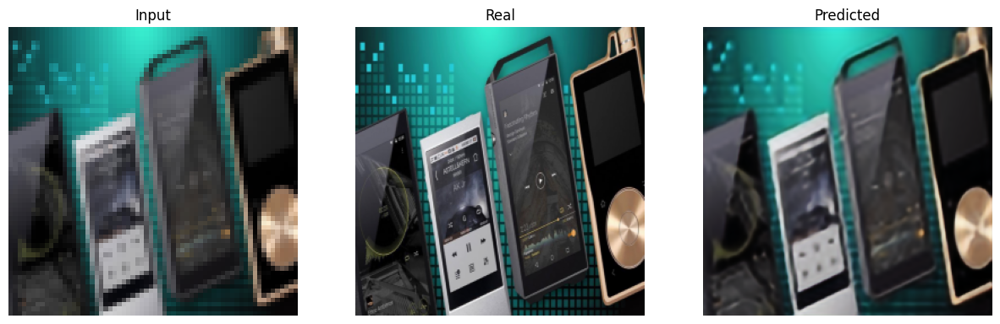

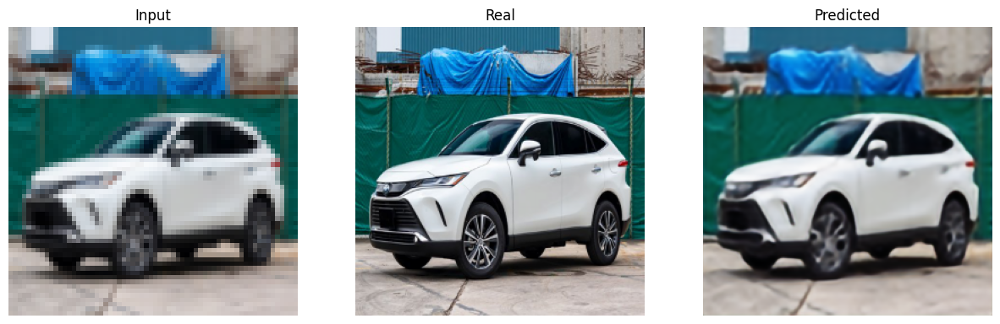

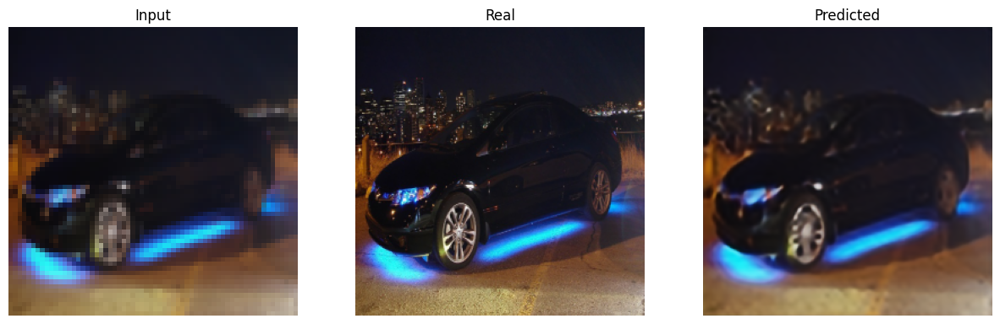

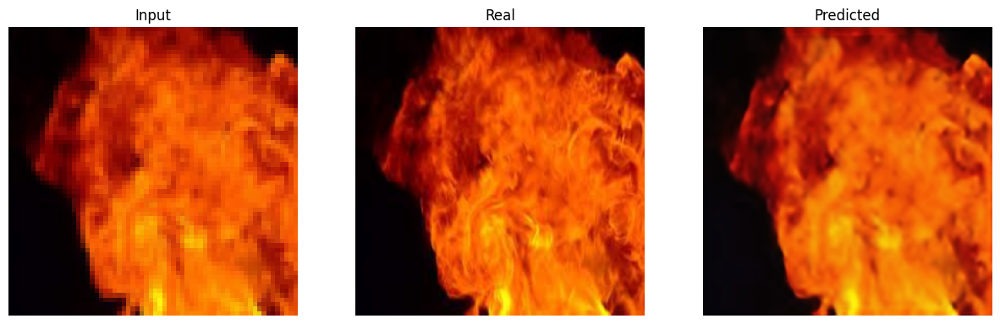

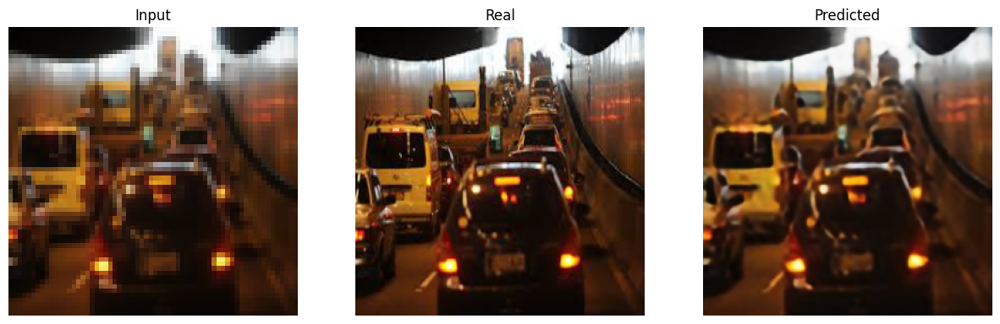

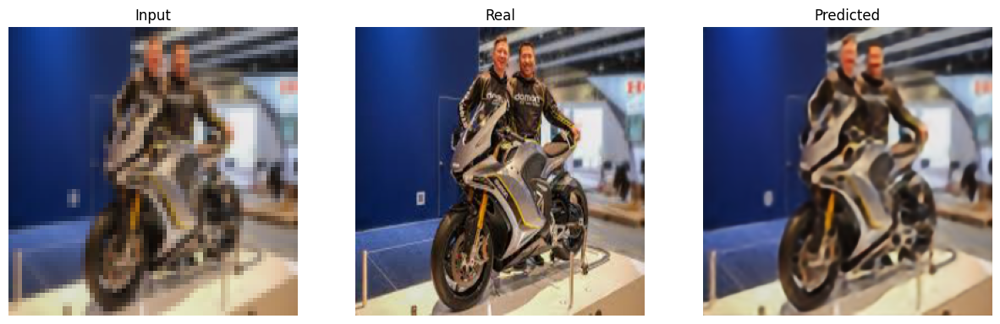

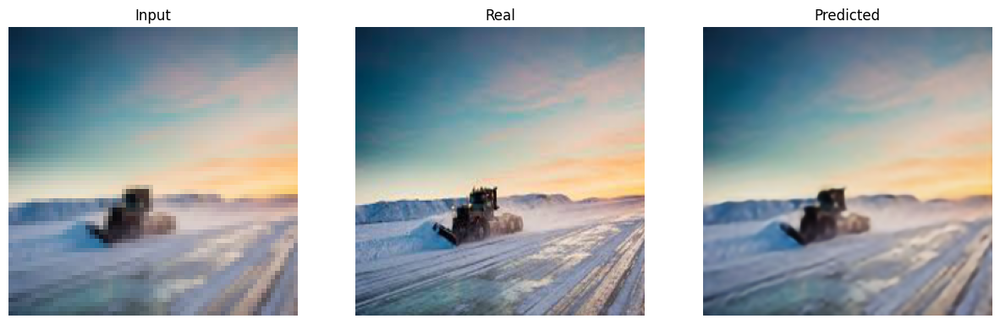

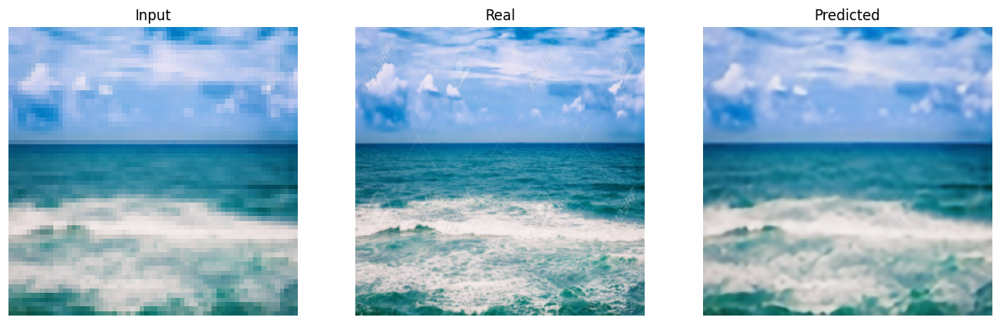

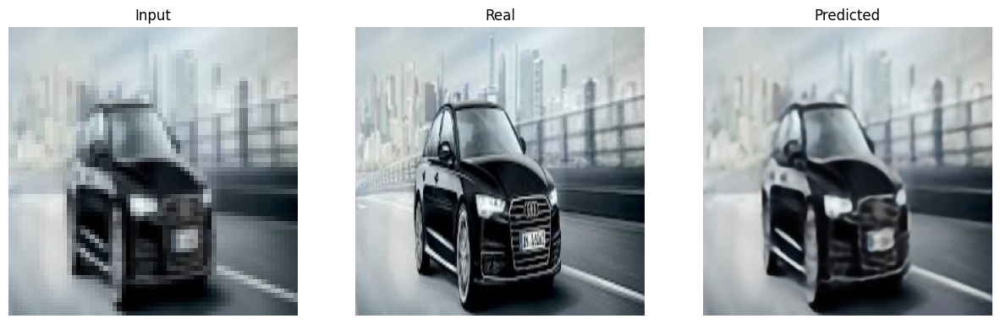

In [25]:
predict_and_display(SR_unet_model, test_loader, device)